<a href="https://colab.research.google.com/github/depresssed-kid/egg_crack_detection/blob/main/white_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 60.2 MB/s eta 0:00:00


In [2]:
from torch.utils.data import Dataset
import os, zipfile
import matplotlib.pyplot as plt
import cv2
import random
import numpy as np
from PIL import Image, ImageDraw
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import torch
from collections import Counter
import json
from ultralytics import YOLO
import pandas as pd

from ultralytics.utils.plotting import Annotator, colors
from IPython.display import Image, display


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
#распакуем архив с датасетом и создадим массивы с путями до файлов
path = '/content/drive/MyDrive/work/egg_detection' #изменить если путь отличается
file_name = '/filtered_white_eggs.zip' #изменить если имя отличается

zipFile = zipfile.ZipFile(path+file_name, 'r')
zipFile.extractall()

image_dir = 'images'
label_dir = 'labels'

labels = sorted([os.path.join(label_dir, f) for f in os.listdir(label_dir) if f.endswith('.txt')])
images = sorted([os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith('.jpg') or f.endswith('.png')])

In [4]:
def remap_class_ids(label_dir):
    """
    Проходит по всем текстовым файлам разметки в указанном каталоге и изменяет
    идентификаторы классов объектов с диапазона 3-5 на 0-2.

    Args:
        label_dir (str): Путь к каталогу с текстовыми файлами разметки (YOLO format).
    """
    for filename in os.listdir(label_dir):
        if filename.endswith('.txt'):
            label_path = os.path.join(label_dir, filename)
            modified_lines = []
            try:
                with open(label_path, 'r') as f:
                    for line in f:
                        parts = line.strip().split()
                        if parts:
                            class_id = int(parts[0])
                            if 3 <= class_id <= 5:
                                new_class_id = class_id - 3
                                modified_lines.append(f"{new_class_id} {' '.join(parts[1:])}\n")
                            else:
                                modified_lines.append(line)

                with open(label_path, 'w') as f:
                    f.writelines(modified_lines)

            except Exception as e:
                print(f"Error processing {filename}: {e}")



In [5]:
def create_yolo_dataset_dict(image_paths, label_paths):
    """
    Преобразует пути к изображениям и текстовым файлам разметки (YOLO format)
    в словарь, подходящий для использования с YOLO моделями,
    учитывая только bounding box аннотации.

    Args:
        image_paths: Список путей к изображениям.
        label_paths: Список путей к текстовым файлам разметки (в формате YOLO).

    Returns:
        dict: Словарь с информацией о датасете в формате, поддерживаемом YOLO.
    """
    dataset_dict = {
        "images": [],
        "annotations": [],
        "categories": [
            {"id": 0, "name": "egg"},
            {"id": 1, "name": "egg-crack"},
            {"id": 2, "name": "egg-dirty"}
        ]
    }

    image_dict = {os.path.basename(img_path): img_path for img_path in image_paths}

    ann_id = 1
    for label_path in label_paths:
        label_filename = os.path.basename(label_path)
        img_filename = label_filename.replace('.txt', '.jpg')

        img_path = image_dict.get(img_filename)

        if img_path is None:
            continue

        try:
            with Image.open(img_path) as img:
                w, h = img.size
        except FileNotFoundError:
            print(f"Warning: Image file not found: {img_path}")
            continue


        image_info = {
            "file_name": os.path.basename(img_path),
            "height": h,
            "width": w,
            "id": len(dataset_dict["images"]) + 1
        }
        dataset_dict["images"].append(image_info)

        image_id = image_info["id"]

        with open(label_path, 'r') as f:
            for line in f.readlines():
                parts = list(map(float, line.strip().split()))
                if len(parts) != 5:
                    continue

                class_id = int(parts[0])
                center_x, center_y, bbox_width_norm, bbox_height_norm = parts[1:]

                bbox_x_center = center_x * w
                bbox_y_center = center_y * h
                bbox_width = bbox_width_norm * w
                bbox_height = bbox_height_norm * h

                x_min = bbox_x_center - (bbox_width / 2)
                y_min = bbox_y_center - (bbox_height / 2)

                bbox = [x_min, y_min, bbox_width, bbox_height]

                area = bbox_width * bbox_height


                annotation_info = {
                    "id": ann_id,
                    "image_id": image_id,
                    "category_id": class_id,
                    "area": area,
                    "bbox": bbox,
                    "iscrowd": 0
                }
                dataset_dict["annotations"].append(annotation_info)
                ann_id += 1

    return dataset_dict

In [6]:
X_train, X_res, y_train, y_res = train_test_split(images, labels, test_size=0.2, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_res, y_res, test_size=0.1, random_state=42)

print(f'train size: {len(X_train)} test size: {len(X_test)} val size: {len(X_val)} ')

train size: 1336 test size: 34 val size: 301 


In [7]:
train_dataset_COCO = create_yolo_dataset_dict(X_train, y_train)
val_dataset_COCO = create_yolo_dataset_dict(X_val, y_val)
test_dataset_COCO = create_yolo_dataset_dict(X_test, y_test)

In [8]:
output_base_dir = './coco_dataset'
os.makedirs(output_base_dir, exist_ok=True)

train_dir = os.path.join(output_base_dir, 'train')
val_dir = os.path.join(output_base_dir, 'val')
test_dir = os.path.join(output_base_dir, 'test')

os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)

with open(os.path.join(train_dir, '_annotations.coco.json'), 'w') as f:
    json.dump(train_dataset_COCO, f)

with open(os.path.join(val_dir, '_annotations.coco.json'), 'w') as f:
    json.dump(val_dataset_COCO, f)

with open(os.path.join(test_dir, '_annotations.coco.json'), 'w') as f:
    json.dump(test_dataset_COCO, f)

In [9]:
model = YOLO("yolo12n.pt")

In [10]:
yaml_content = """
path: /content/
train: images/
val: images/
test:  images/ )

# Classes
nc: 3  # number of classes
names: ['egg', 'egg-crack', 'egg-dirty']  # class names

# Augmentation settings
augment: True
hsv_h: 0.0  # чтобы цвета остались исходными
hsv_v: 0.0   # чтобы изображения были однотонными
degrees: 90.0  # Image rotation (+/- degrees)
translate: 0.5 # сильно двигаем т.к. обьекты могут быть в разных частях изображения
scale: 0.7   # т.к. масштаб итоговых обьектов будет другим
shear: 0.0   # стандартное значение улучшающее устойчивость
perspective: 0.0  # т.к. вид всегда сверху
flipud: 0.5 # т.к. вид сверху изображения мы можем вертеть как вертикально так и горизонтально
fliplr: 0.5  #
mosaic: 1.0  # т.к. хочется чтобы было много обьектов
mixup: 0.5   # т.к. перекрытий на итоговом датасете скорее всего не будет
cutmix: 0.5
copy_paste: 0.9 # тоже плотность увеличиваем
# помимо этих аугментаций используются аугментации из albumentations со стандартными значениями т.к. они подходт к специфике задачи
"""

yaml_file_path = 'coco_data.yaml'

with open(yaml_file_path, 'w') as f:
    f.write(yaml_content)

In [33]:
patience = 5
num_epochs = 70 # изначально было 50, но т.к. еще есть куда обучать решил немного добавить
batch=8
augment = True
imgsz=640

In [34]:

#remap_class_ids('./labels') закоментил т.к. запускал второй раз
model_weights_path = 'runs/detect/train/weights/best.pt'
#сделал глупость так как lr выставился заново
trained_model = YOLO(model_weights_path)
trained_model.train(data='coco_data.yaml', epochs=num_epochs, patience=patience, batch=batch, augment = augment, imgsz=imgsz)
#результат не улучшился так что будем использовать лучшие сохраненные веса

Ultralytics 8.3.204 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=coco_data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=70, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=runs/detect/train/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train8, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=5, perspective=0.0, plots=True, 

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e3ed984e000>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04


0: 640x640 1 egg-crack, 6.2ms
1: 640x640 1 egg-crack, 6.2ms
2: 640x640 1 egg-crack, 6.2ms
3: 640x640 1 egg-crack, 6.2ms
4: 640x640 1 egg-crack, 6.2ms
5: 640x640 1 egg-crack, 6.2ms
6: 640x640 1 egg-crack, 6.2ms
7: 640x640 1 egg-crack, 6.2ms
8: 640x640 1 egg-crack, 6.2ms
9: 640x640 1 egg-crack, 6.2ms
10: 640x640 1 egg-crack, 6.2ms
11: 640x640 1 egg-crack, 6.2ms
12: 640x640 1 egg-crack, 6.2ms
13: 640x640 33 eggs, 2 egg-dirtys, 6.2ms
14: 640x640 1 egg-crack, 6.2ms
15: 640x640 1 egg-crack, 6.2ms
16: 640x640 1 egg, 1 egg-crack, 6.2ms
17: 640x640 1 egg-crack, 6.2ms
18: 640x640 1 egg-crack, 6.2ms
19: 640x640 1 egg-crack, 6.2ms
20: 640x640 1 egg-crack, 6.2ms
21: 640x640 1 egg-crack, 6.2ms
22: 640x640 1 egg-crack, 6.2ms
23: 640x640 1 egg-crack, 6.2ms
24: 640x640 1 egg-crack, 6.2ms
25: 640x640 1 egg-crack, 6.2ms
26: 640x640 1 egg-crack, 6.2ms
27: 640x640 1 egg-crack, 6.2ms
28: 640x640 1 egg-crack, 6.2ms
29: 640x640 1 egg-crack, 6.2ms
Speed: 2.6ms preprocess, 6.2ms inference, 0.9ms postprocess pe

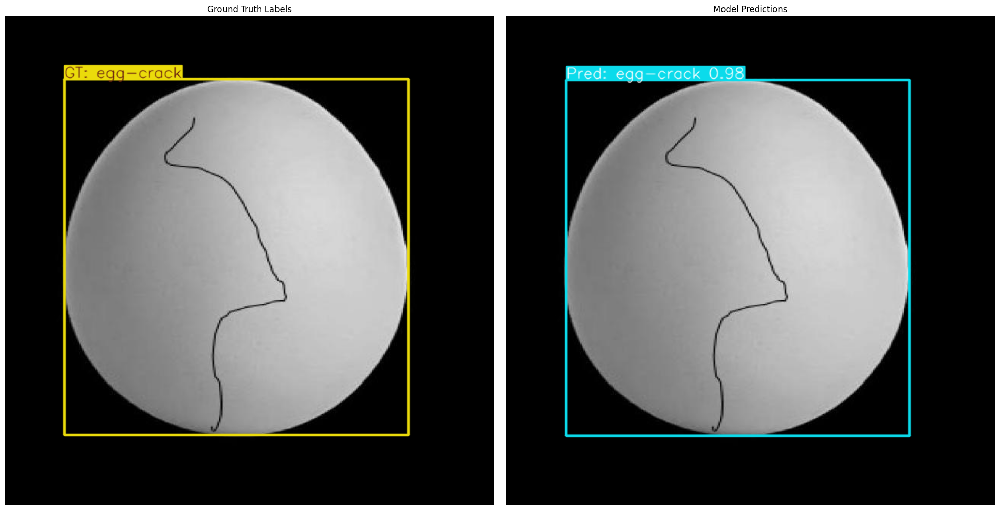

Visualizing image 2/30


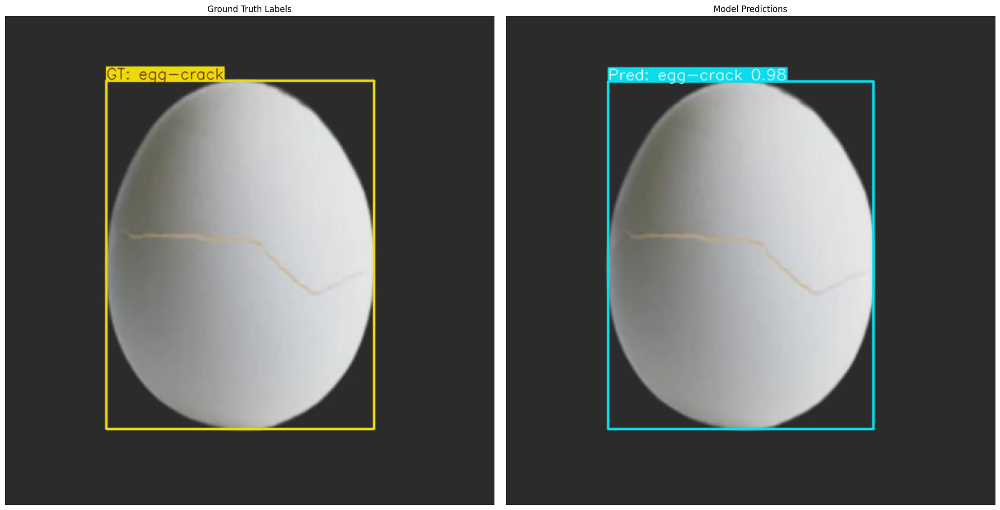

Visualizing image 3/30


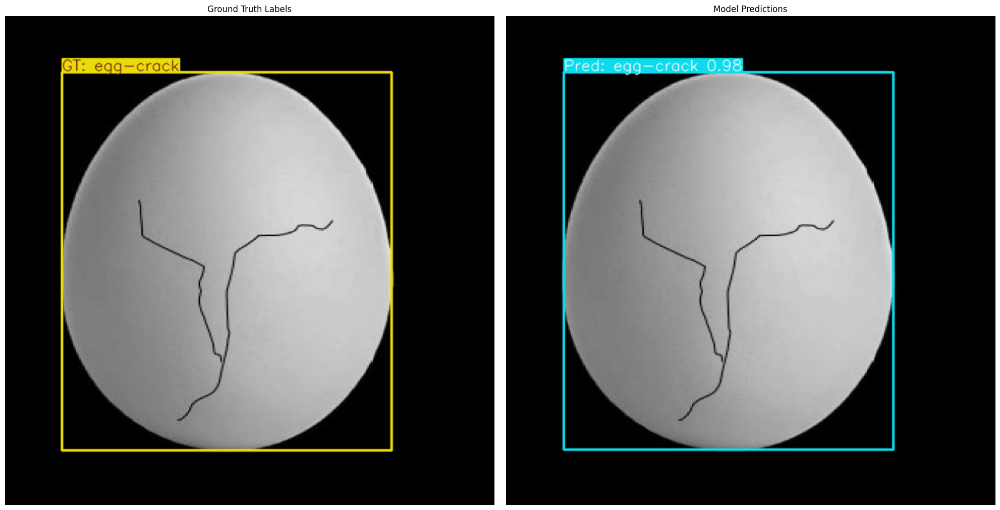

Visualizing image 4/30


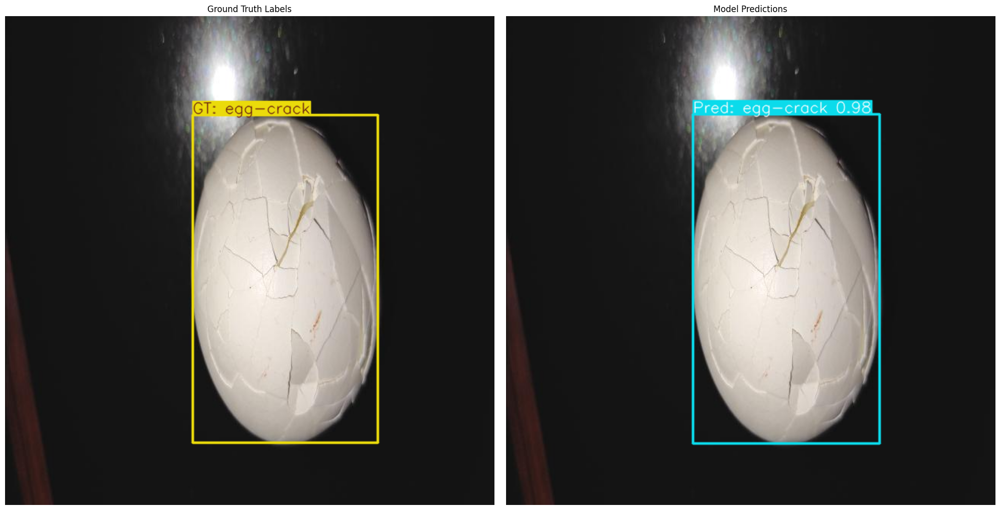

Visualizing image 5/30


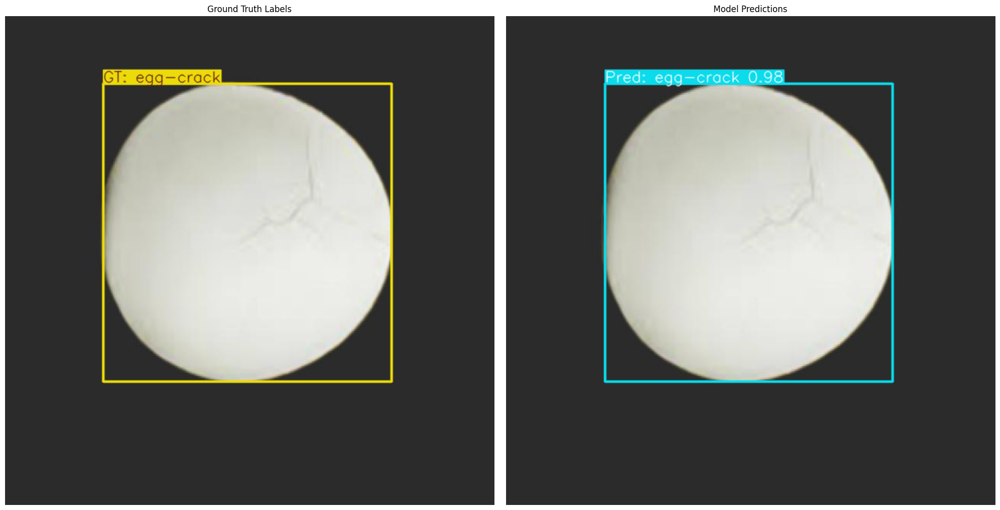

Visualizing image 6/30


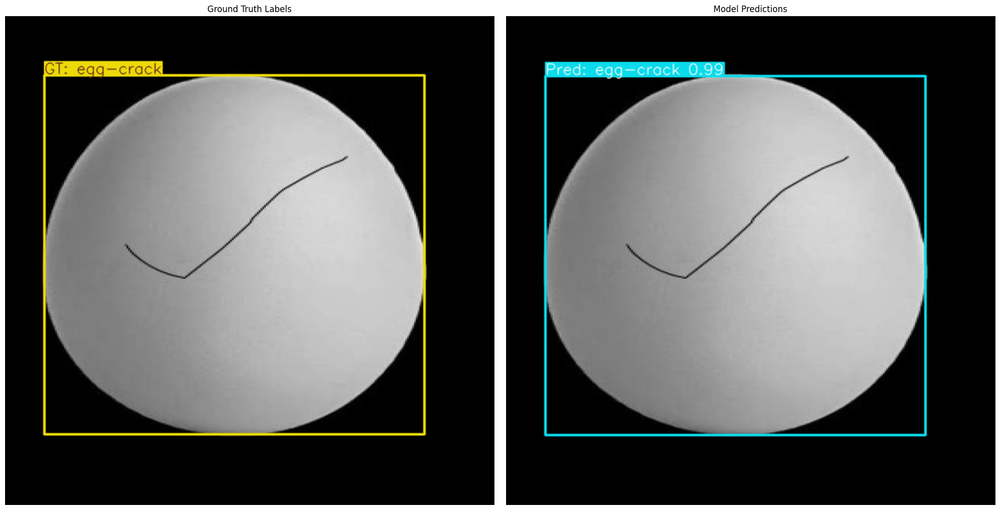

Visualizing image 7/30


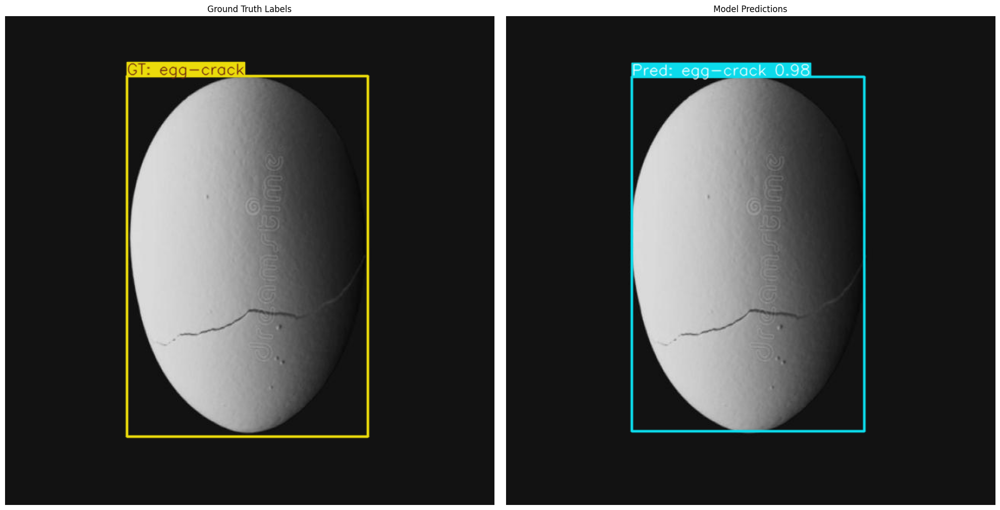

Visualizing image 8/30


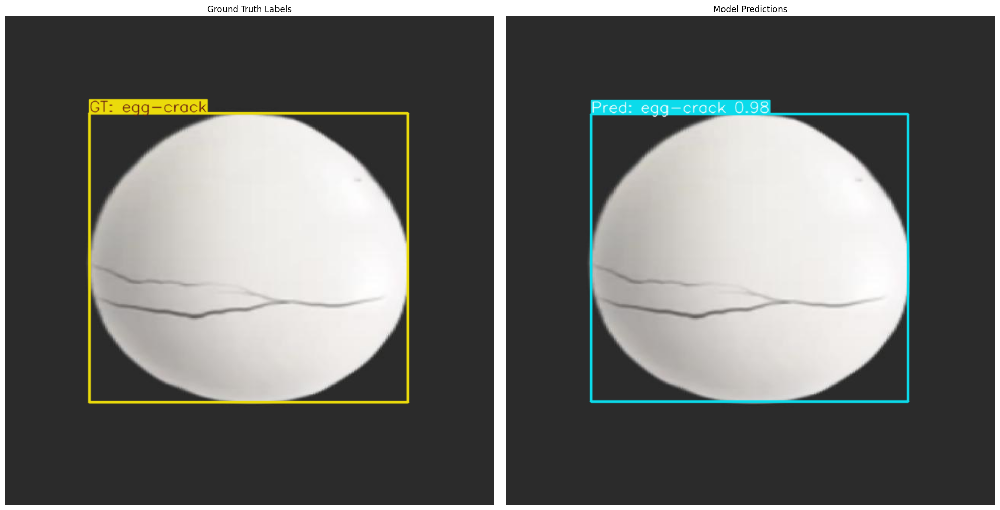

Visualizing image 9/30


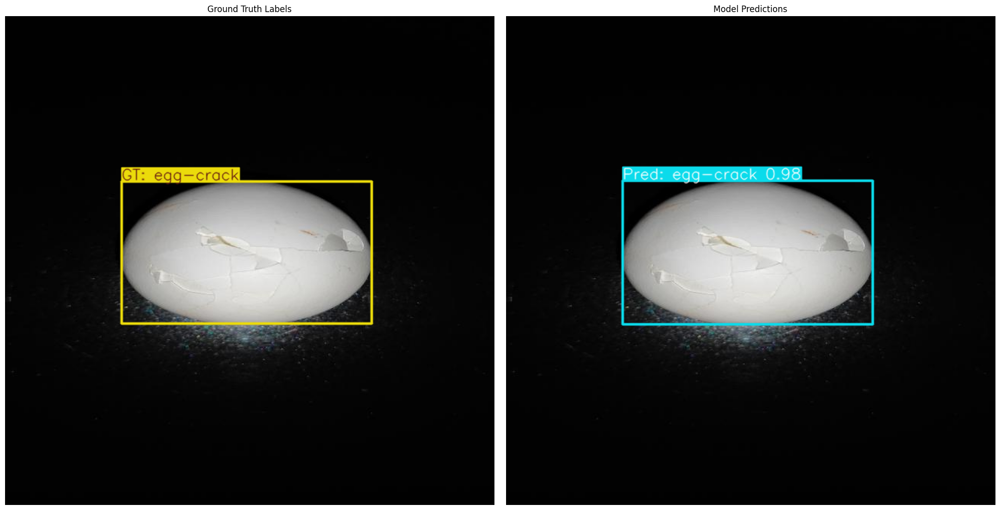

Visualizing image 10/30


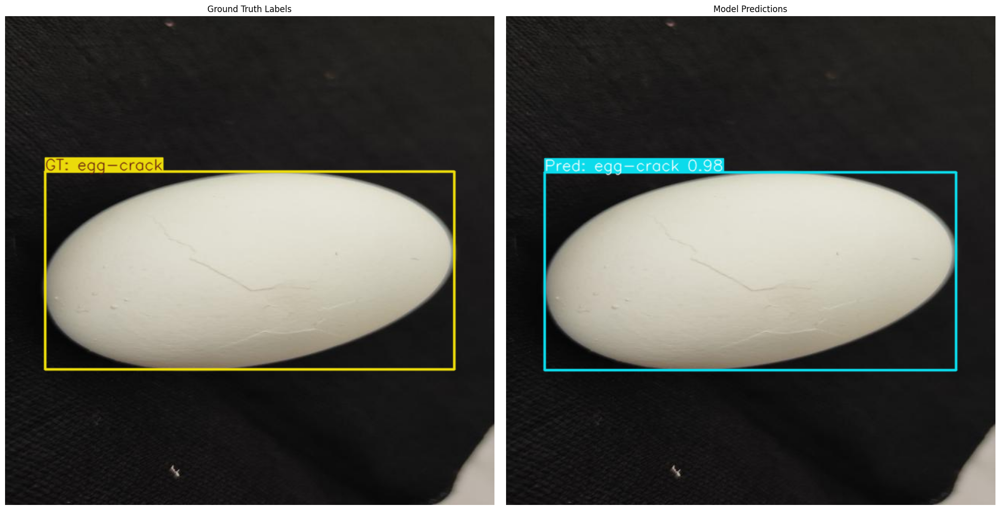

Visualizing image 11/30


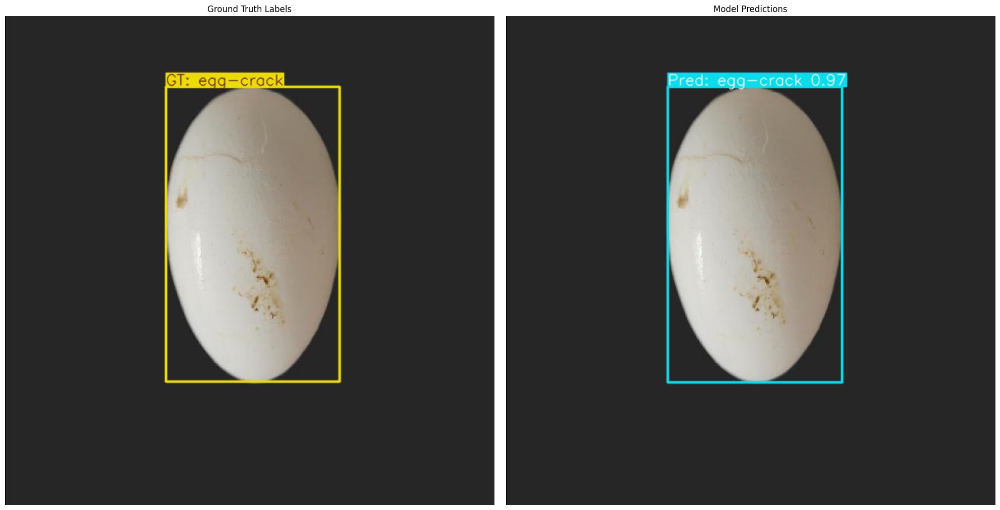

Visualizing image 12/30


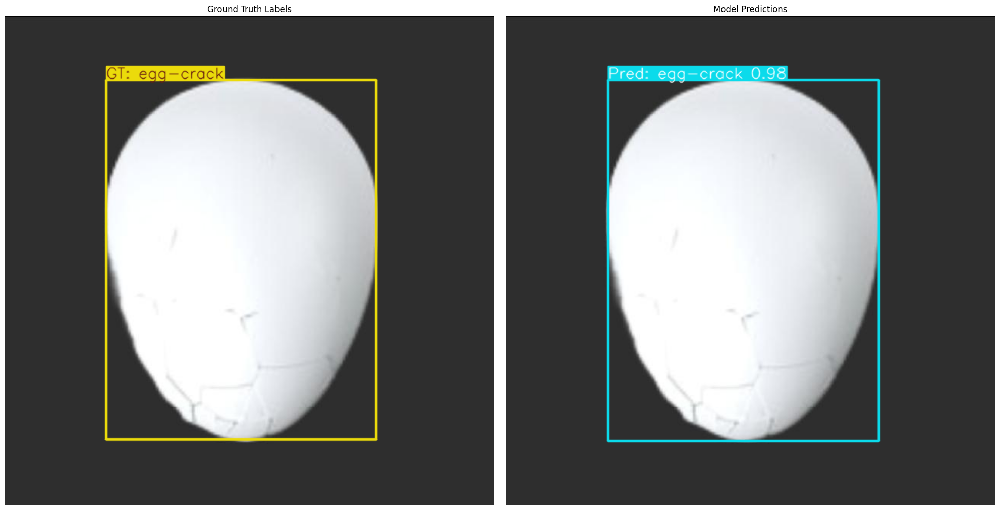

Visualizing image 13/30


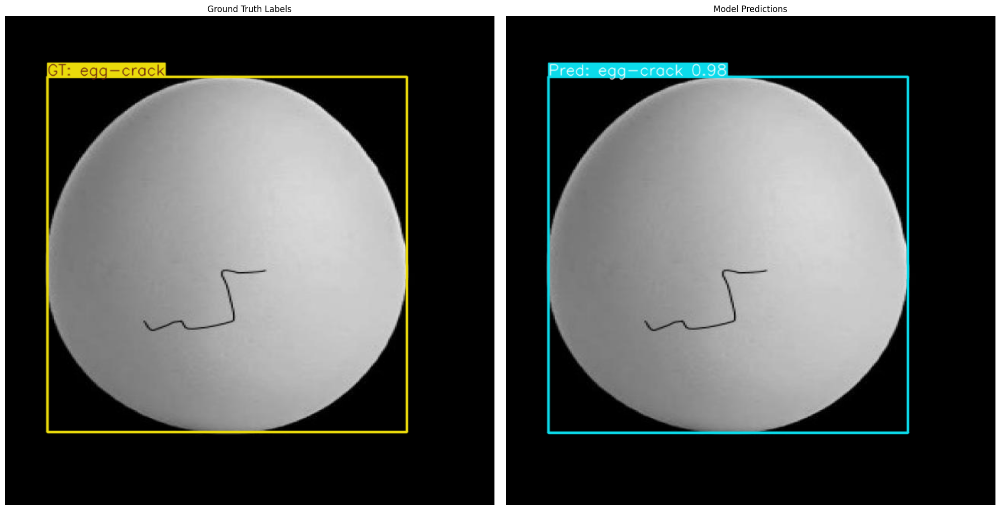

Visualizing image 14/30


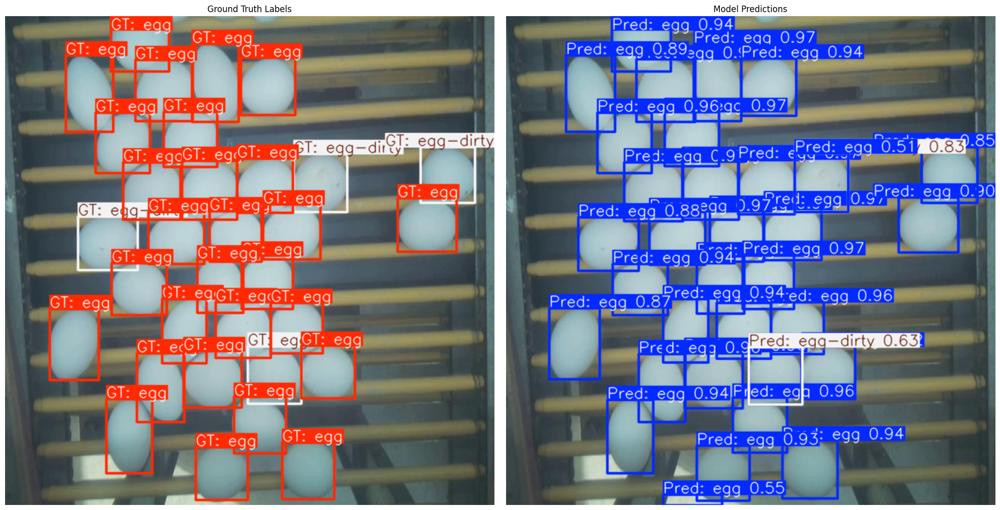

Visualizing image 15/30


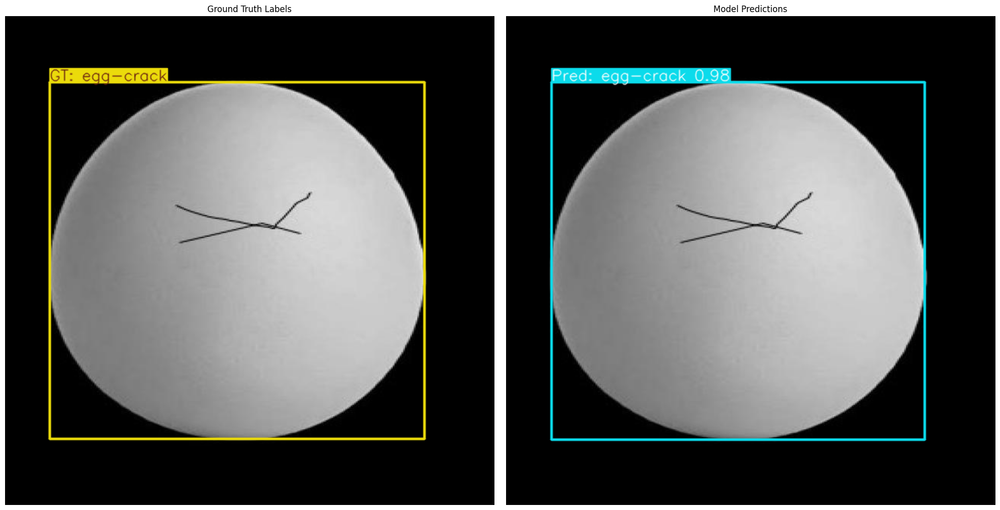

Visualizing image 16/30


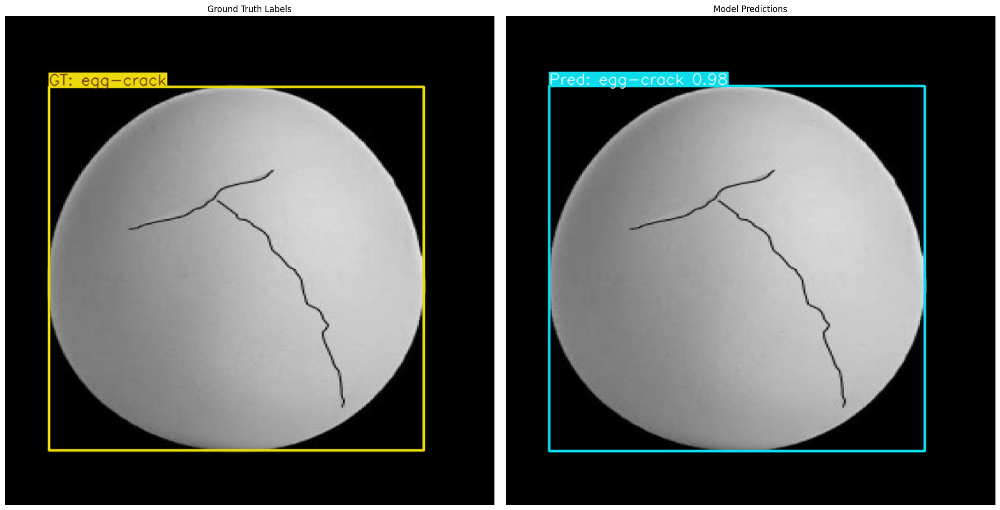

Visualizing image 17/30


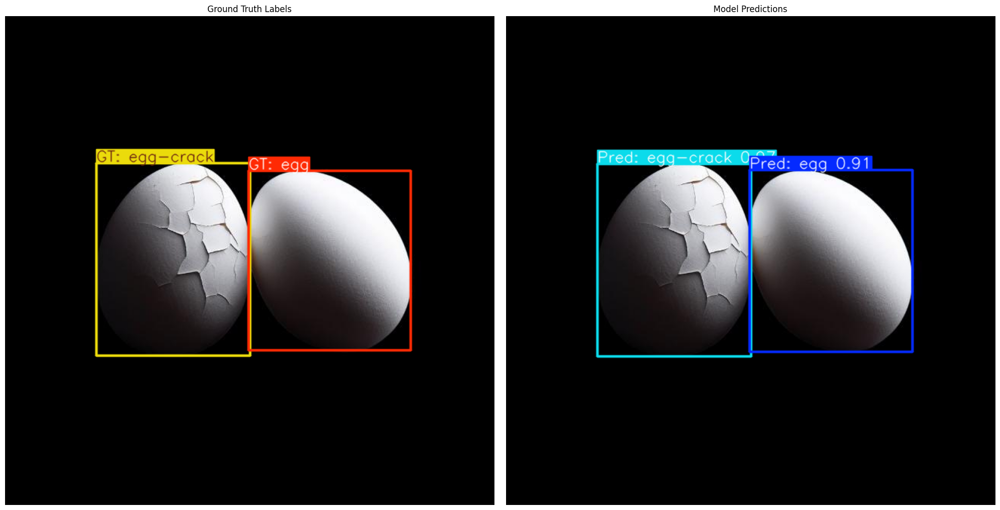

Visualizing image 18/30


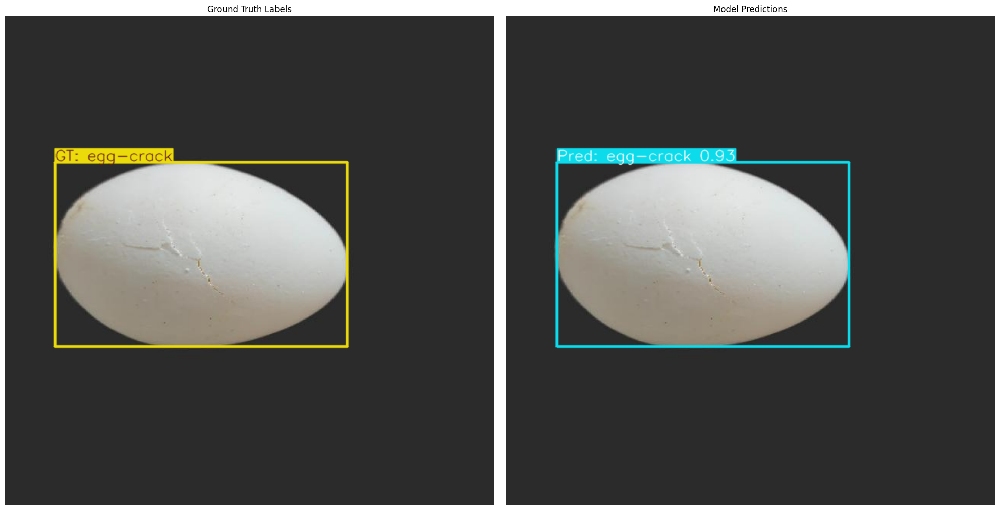

Visualizing image 19/30


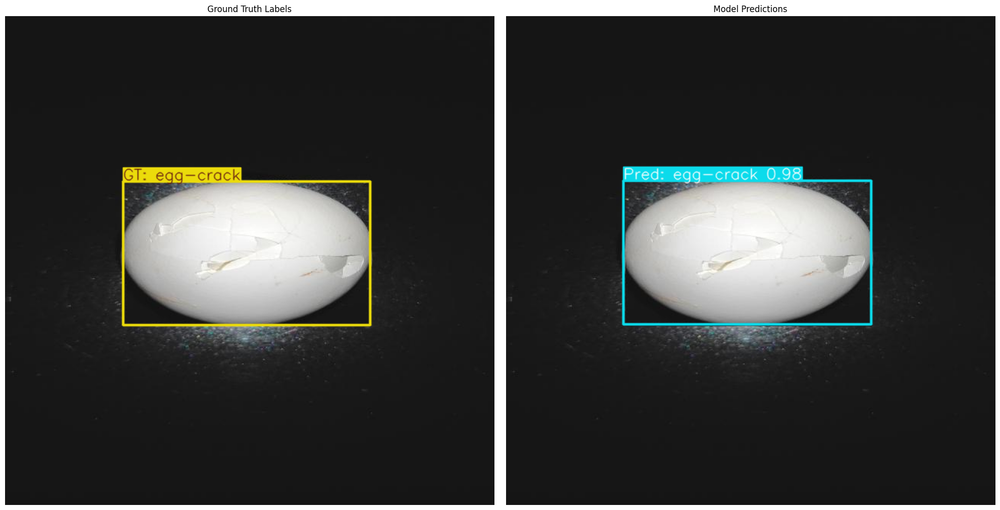

Visualizing image 20/30


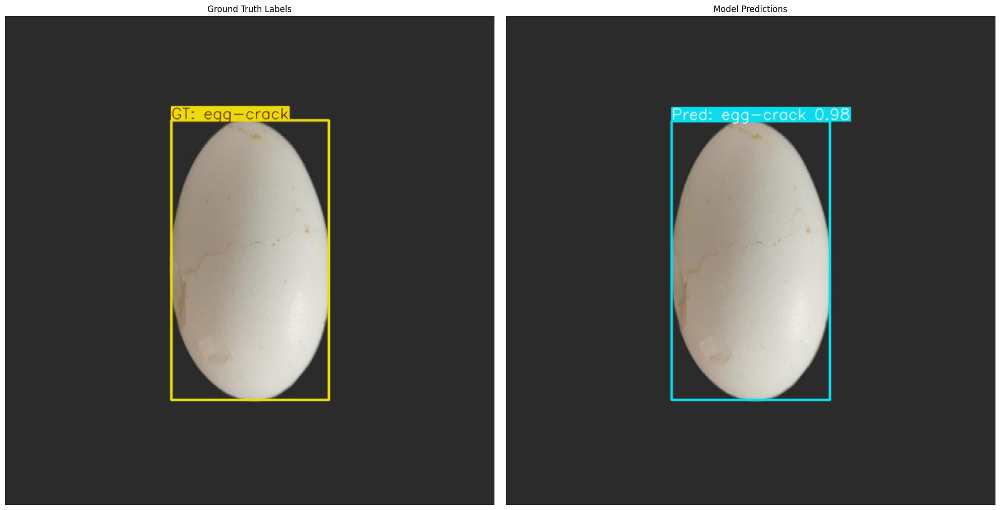

Visualizing image 21/30


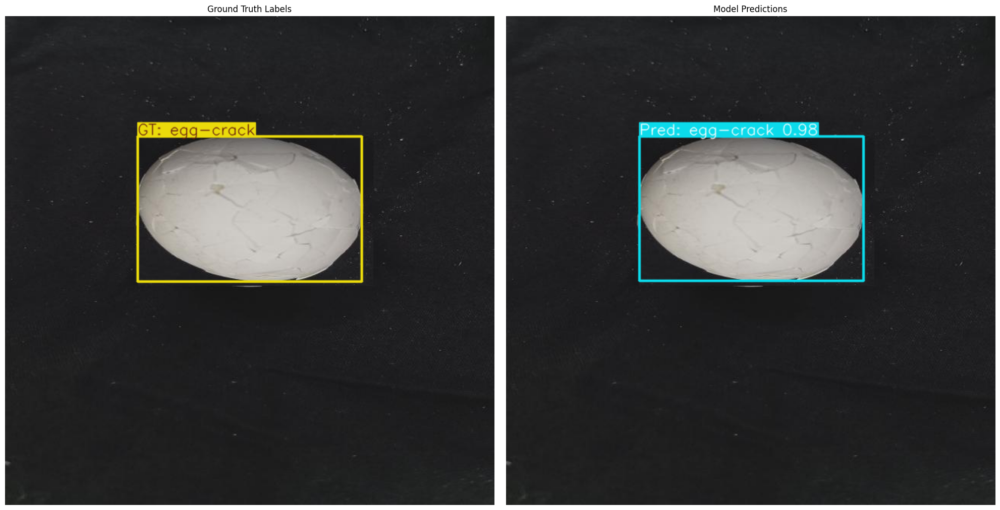

Visualizing image 22/30


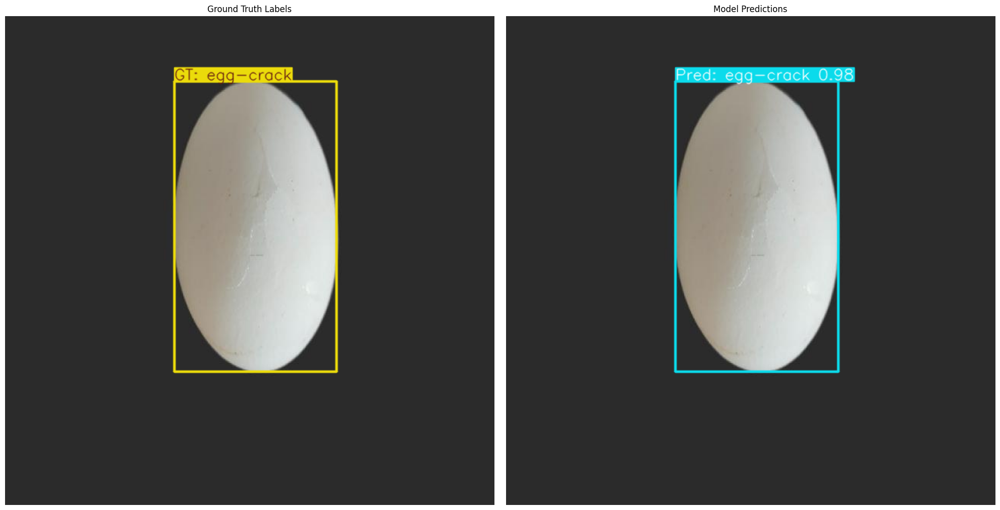

Visualizing image 23/30


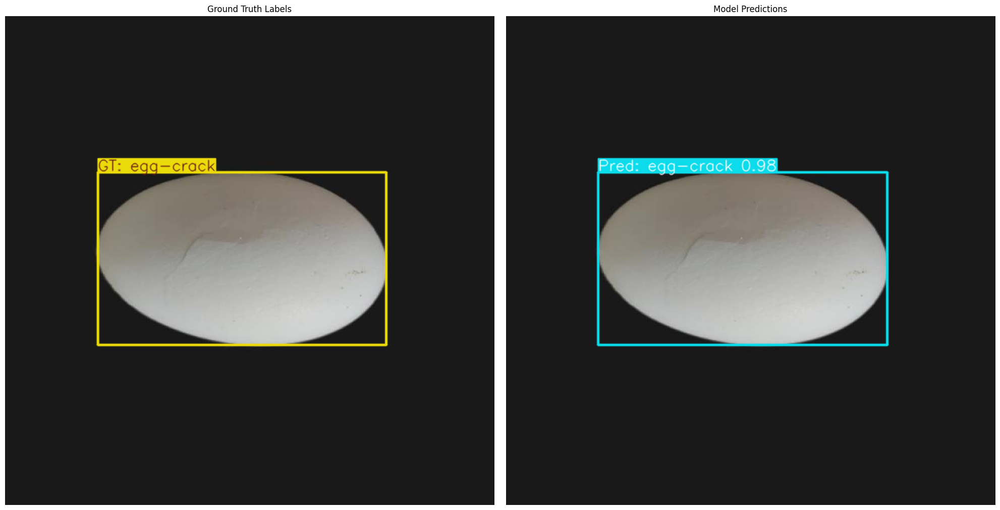

Visualizing image 24/30


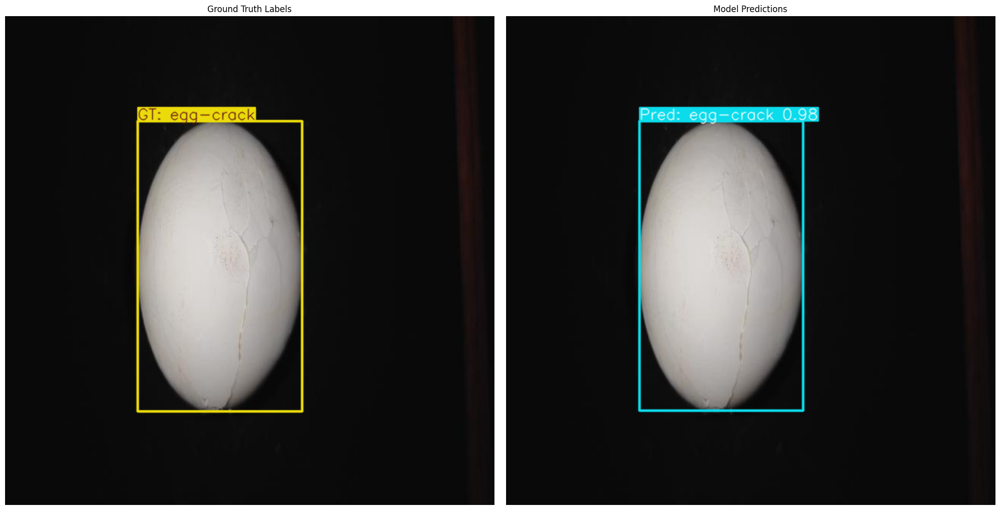

Visualizing image 25/30


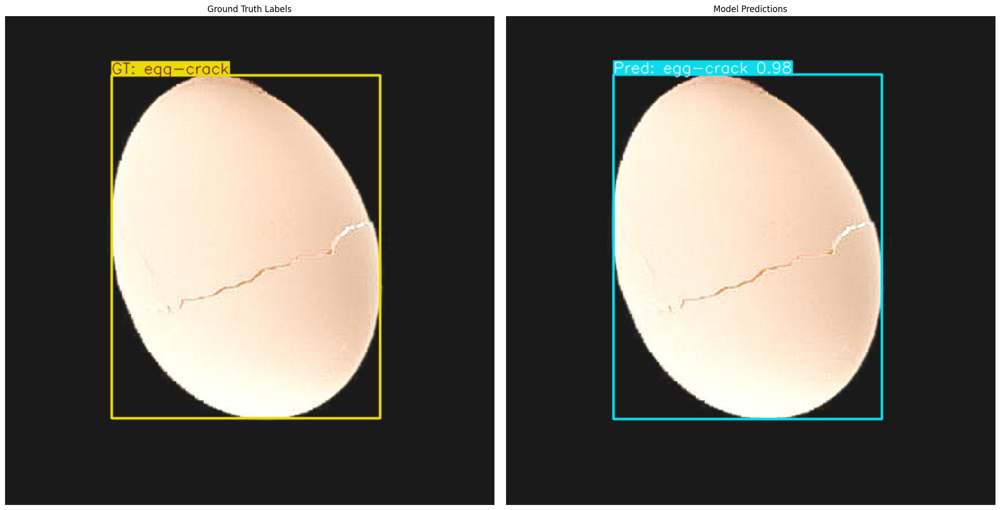

Visualizing image 26/30


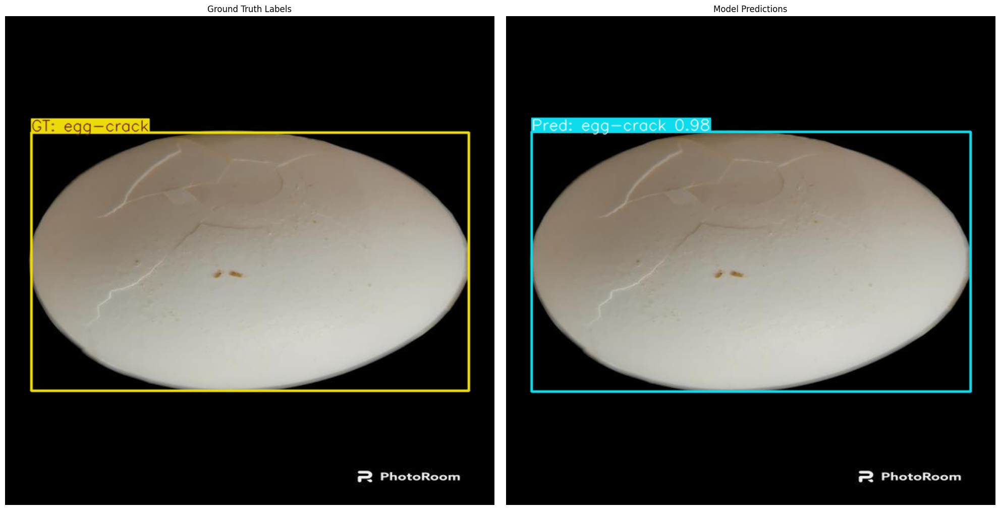

Visualizing image 27/30


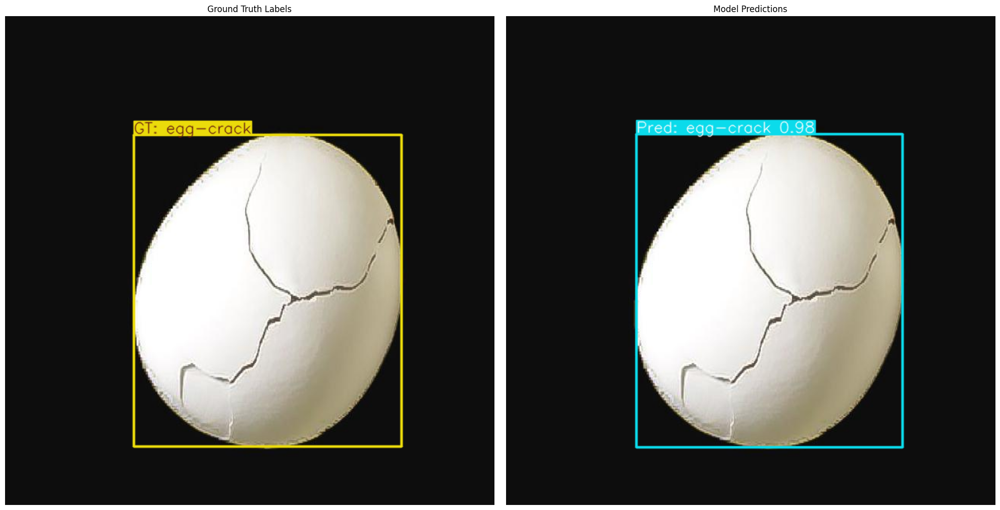

Visualizing image 28/30


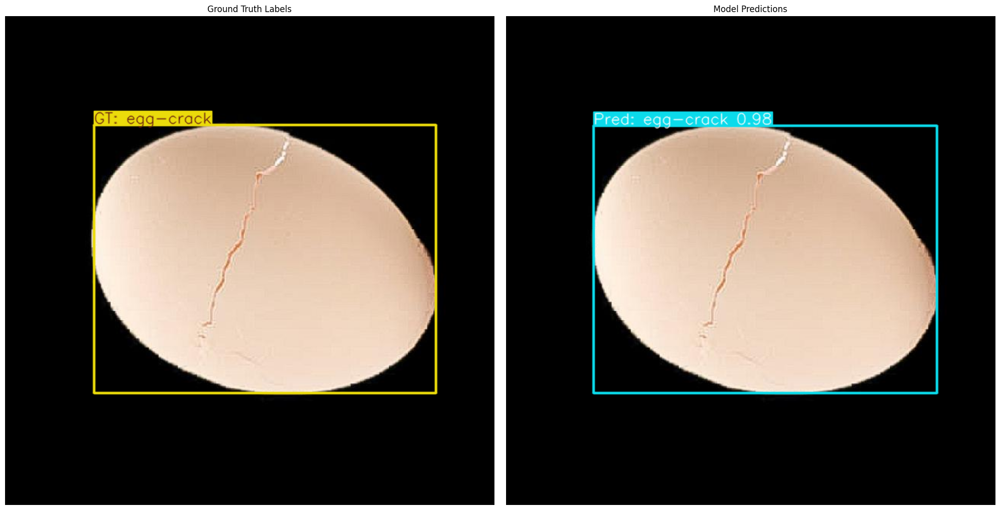

Visualizing image 29/30


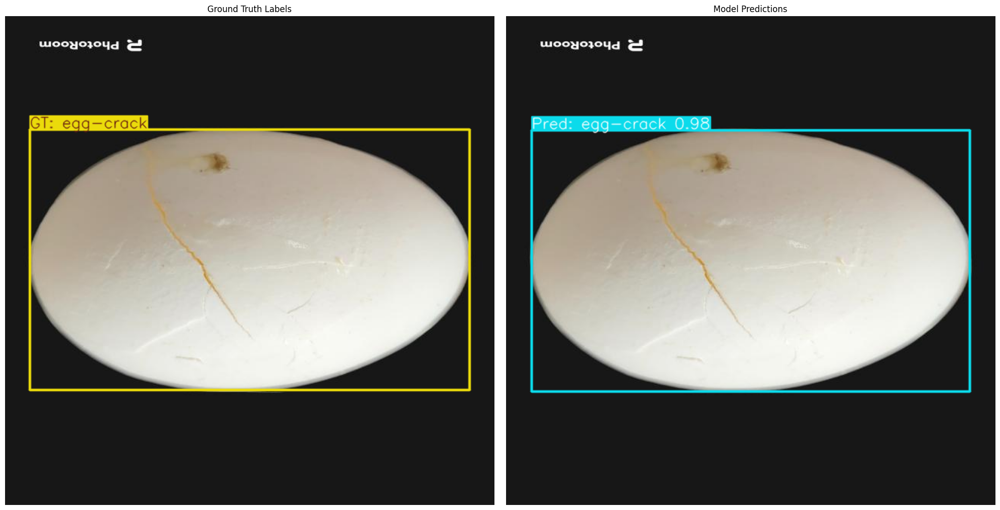

Visualizing image 30/30


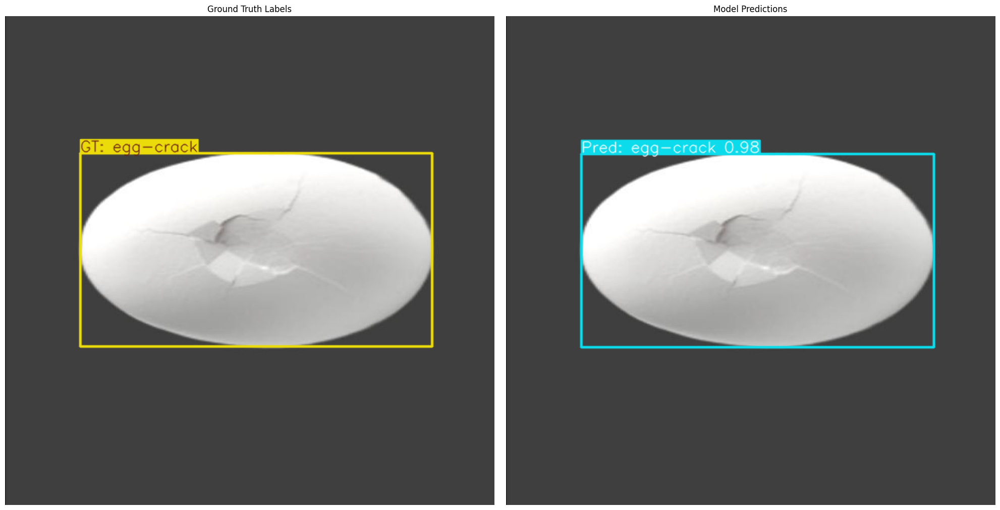

In [22]:
def get_predictions(model, images):
    """
    Получает предсказания модели YOLO для батча изображений.

    Args:
        model: Обученная модель YOLO (объект ultralytics.YOLO).
        images: Список или тензор изображений для предсказания.

    Returns:
        list: Список объектов Results, содержащих предсказания для каждого изображения.
    """

    model.eval()
    with torch.no_grad():
        results = model(images)
    return results

def visualize_predictions(image, predictions, ground_truth_labels, class_names):
    """
    Визуализирует предсказания модели и истинные метки на отдельных изображениях
    и отображает их рядом.

    Args:
        image: Изображение в формате numpy array (RGB).
        predictions: Объект Results, содержащий предсказания для изображения.
        ground_truth_labels: Список истинных меток для изображения в формате YOLO [class_id, center_x, center_y, width, height].
        class_names: Список названий классов.
    """
    img_gt = np.array(image.copy())
    img_pred = np.array(image.copy())

    annotator_gt = Annotator(img_gt, line_width=2, example=class_names)
    annotator_pred = Annotator(img_pred, line_width=2, example=class_names)

    h, w = img_gt.shape[:2]

    for label in ground_truth_labels:
        class_id = int(label[0])
        center_x_norm, center_y_norm, width_norm, height_norm = label[1:]

        x_center, y_center = int(center_x_norm * w), int(center_y_norm * h)
        bbox_width, bbox_height = int(width_norm * w), int(height_norm * h)
        x_min = int(x_center - bbox_width / 2)
        y_min = int(y_center - bbox_height / 2)
        x_max = int(x_center + bbox_width / 2)
        y_max = int(y_center + bbox_height / 2)

        annotator_gt.box_label([x_min, y_min, x_max, y_max], label=f"GT: {class_names[class_id]}", color=colors(class_id, True))


    if predictions.boxes is not None:
        for box in predictions.boxes:
            xyxy = box.xyxy[0].tolist()
            conf = box.conf[0].item()
            cls = int(box.cls[0].item())

            annotator_pred.box_label(xyxy, label=f"Pred: {class_names[cls]} {conf:.2f}", color=colors(cls, False))

    annotated_img_gt = annotator_gt.result()
    annotated_img_pred = annotator_pred.result()

    fig, axes = plt.subplots(1, 2, figsize=(20, 10))

    axes[0].imshow(annotated_img_gt)
    axes[0].set_title("Ground Truth Labels")
    axes[0].axis('off')


    axes[1].imshow(annotated_img_pred)
    axes[1].set_title("Model Predictions")
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

sample_indices = random.sample(range(len(X_test)), k=30)
sample_images_paths = [X_test[i] for i in sample_indices]
sample_labels_paths = [y_test[i] for i in sample_indices]


sample_images = [cv2.imread(img_path) for img_path in sample_images_paths]
sample_images = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in sample_images]

model_weights_path = 'runs/detect/train/weights/best.pt'
trained_model = YOLO(model_weights_path)
predictions = get_predictions(trained_model, sample_images)


sample_ground_truth_labels = []
for label_path in sample_labels_paths:
    labels_list = []
    with open(label_path, 'r') as f:
        for line in f.readlines():
            parts = list(map(float, line.strip().split()))
            if len(parts) == 5:
                labels_list.append(parts)
    sample_ground_truth_labels.append(labels_list)

class_names = ['egg', 'egg-crack', 'egg-dirty']
for i in range(len(sample_images)):
    print(f"Visualizing image {i+1}/{len(sample_images)}")
    visualize_predictions(sample_images[i], predictions[i], sample_ground_truth_labels[i], class_names)



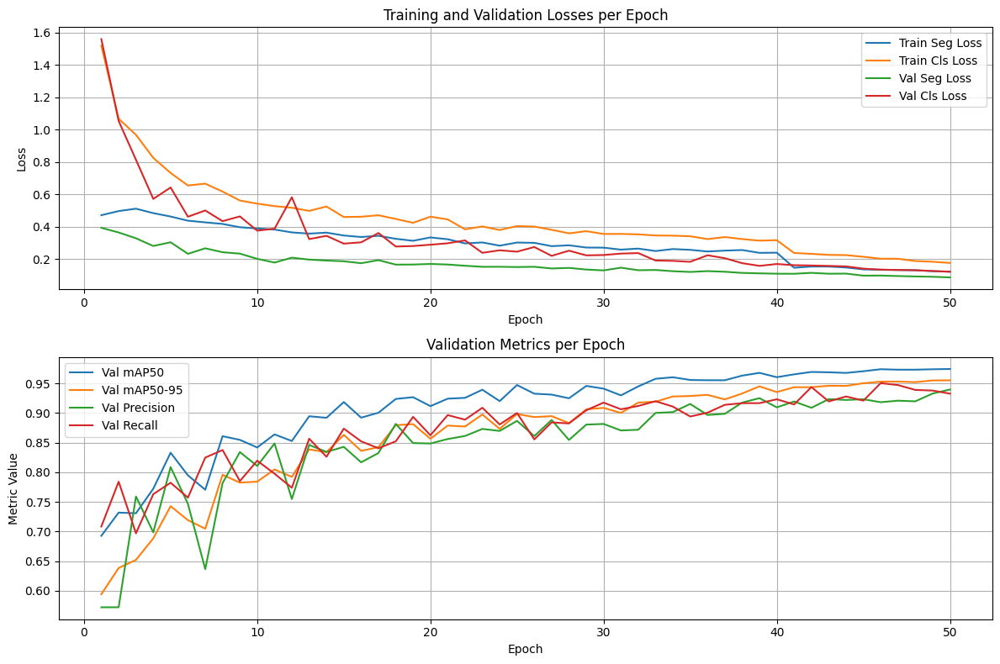

In [15]:
def plot_training_results(results_csv_path):
    """
    Строит графики лоссов и метрик из файла results.csv.

    Args:
        results_csv_path (str): Путь к файлу results.csv.
    """
    if not os.path.exists(results_csv_path):
        print(f"Ошибка: Файл не найден по пути: {results_csv_path}")
        return

    df = pd.read_csv(results_csv_path, comment='#')

    df.columns = df.columns.str.strip()

    required_columns = ['epoch', 'train/box_loss', 'train/cls_loss',
                        'val/box_loss', 'val/cls_loss',
                        'metrics/precision(B)', 'metrics/recall(B)',
                        'metrics/mAP50(B)', 'metrics/mAP50-95(B)',
                        ]

    if not all(col in df.columns for col in required_columns):
        print("Ошибка: CSV файл не содержит всех ожидаемых столбцов для построения графиков.")
        print("Ожидаемые столбцы:", required_columns)
        print("Найденные столбцы:", df.columns.tolist())
        return


    plt.figure(figsize=(12, 8))
    #losses
    plt.subplot(2, 1, 1)

    plt.plot(df['epoch'], df['train/box_loss'], label='Train Seg Loss')
    plt.plot(df['epoch'], df['train/cls_loss'], label='Train Cls Loss')

    plt.plot(df['epoch'], df['val/box_loss'], label='Val Seg Loss')
    plt.plot(df['epoch'], df['val/cls_loss'], label='Val Cls Loss')
    plt.title('Training and Validation Losses per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # metrics
    plt.subplot(2, 1, 2)

    plt.plot(df['epoch'], df['metrics/mAP50(B)'], label='Val mAP50')
    plt.plot(df['epoch'], df['metrics/mAP50-95(B)'], label='Val mAP50-95')

    plt.plot(df['epoch'], df['metrics/precision(B)'], label='Val Precision')
    plt.plot(df['epoch'], df['metrics/recall(B)'], label='Val Recall')

    plt.title('Validation Metrics per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Metric Value')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()


results_file = 'runs/detect/train/results.csv'
plot_training_results(results_file)

Отображение графика результатов обучения: /content/runs/detect/train/results.png


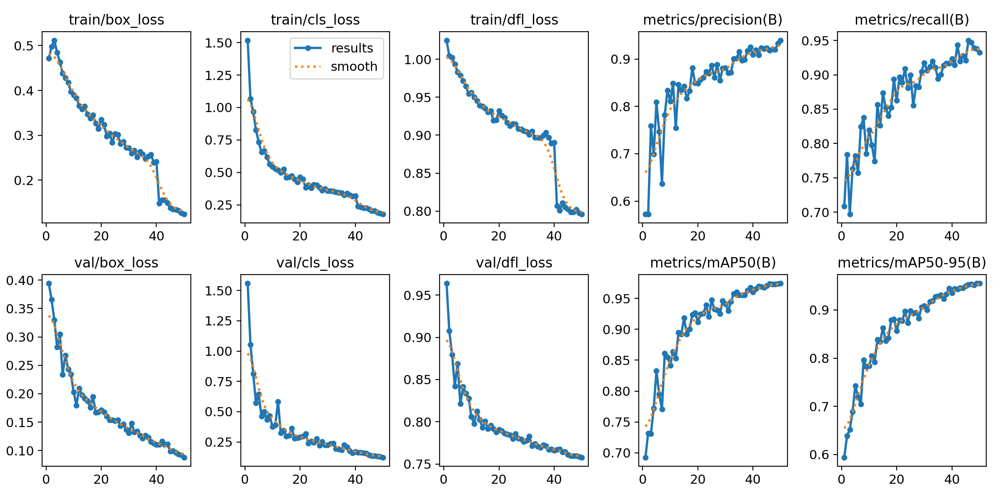


Отображение матрицы ошибок: /content/runs/detect/train/confusion_matrix.png


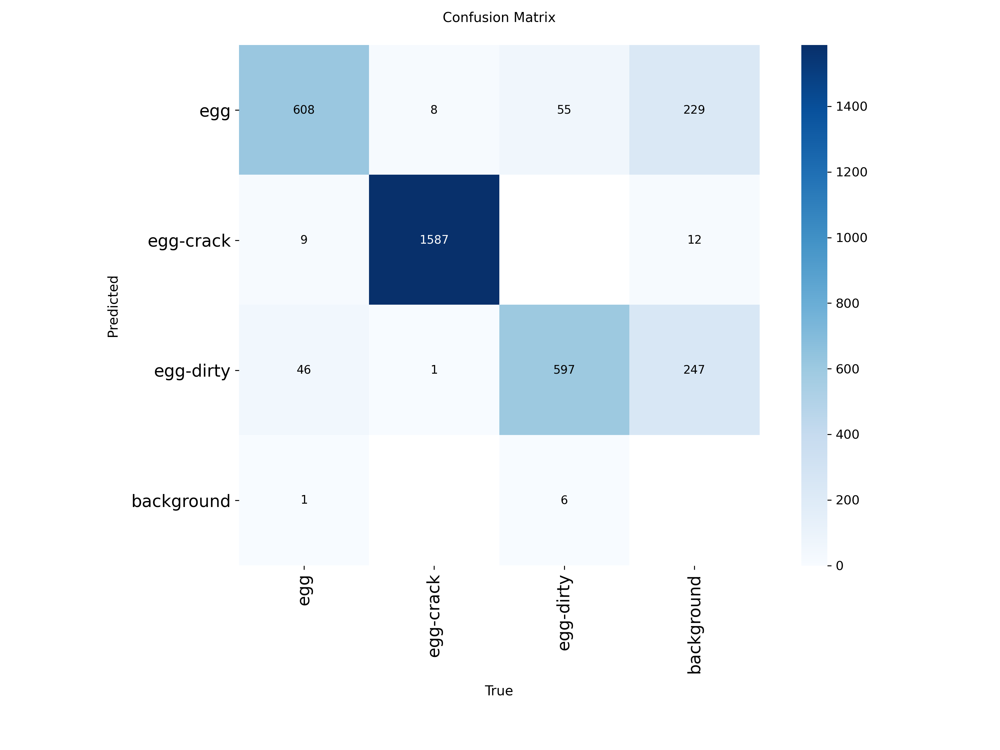


Отображение меток на обучающих данных: /content/runs/detect/train/labels.jpg


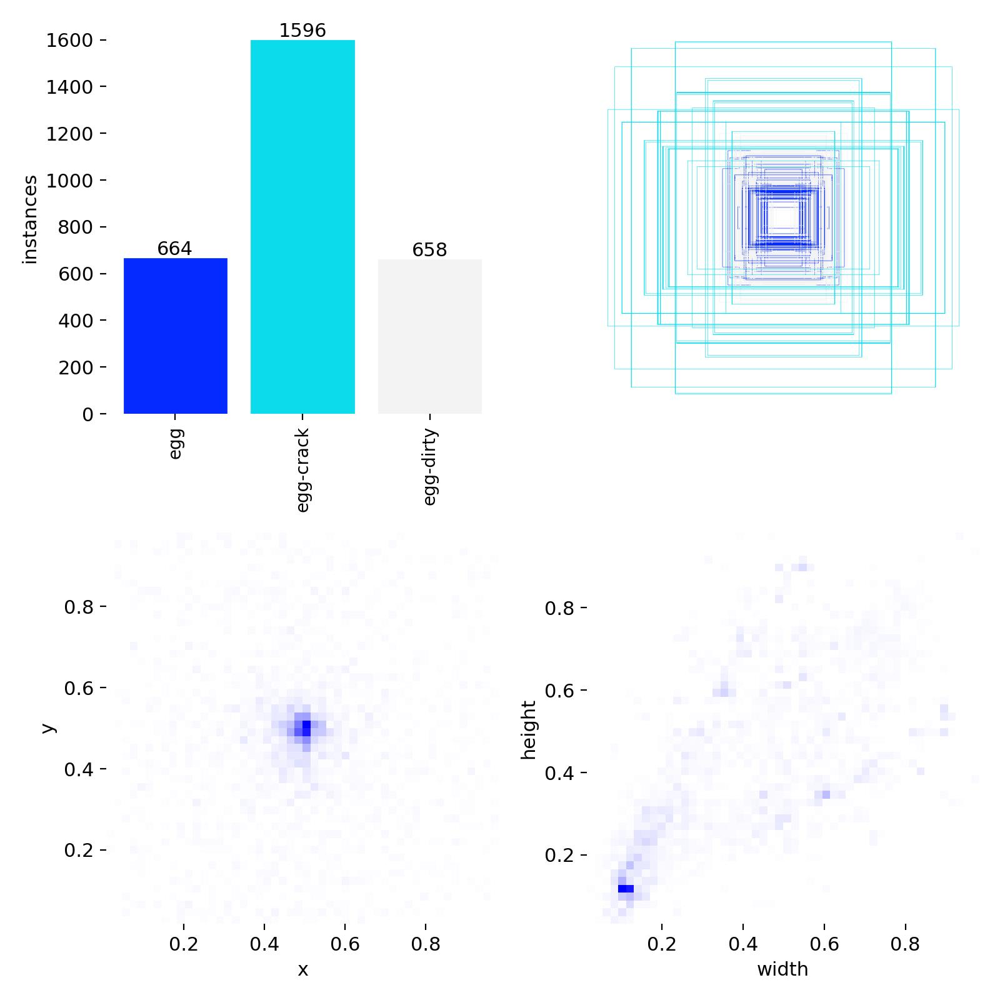

In [35]:
#yolo картиночки
results_img_path = '/content/runs/detect/train/results.png'

if os.path.exists(results_img_path):
    print(f"Отображение графика результатов обучения: {results_img_path}")
    display(Image(filename=results_img_path))
else:
    print(f"Файл не найден: {results_img_path}")
    print("Пожалуйста, проверьте правильность пути к результатам обучения.")

confusion_matrix_path = '/content/runs/detect/train/confusion_matrix.png'
if os.path.exists(confusion_matrix_path):
    print(f"\nОтображение матрицы ошибок: {confusion_matrix_path}")
    display(Image(filename=confusion_matrix_path))

labels_img_path = '/content/runs/detect/train/labels.jpg'
if os.path.exists(labels_img_path):
     print(f"\nОтображение меток на обучающих данных: {labels_img_path}")
     display(Image(filename=labels_img_path))

predictions_img_path = '/content/runs/detect/train/predictions.jpg'
if os.path.exists(predictions_img_path):
     print(f"\nОтображение предсказаний на валидационных данных: {predictions_img_path}")
     display(Image(filename=predictions_img_path))